In [1]:
# For looking at one IS2 cycle at a time

In [402]:
#Sort in order of appearance

import numpy as np
from numpy import array as a
import sys
import logging
import concurrent.futures
import configparser
import time
from datetime import datetime
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from pyproj import Transformer, CRS
import shapely.geometry as sg
from shapely.geometry import Polygon, Point
from sliderule import sliderule, icesat2, earthdata, h5, ipysliderule, io
import warnings
from IPython import display
import json
import utils.toolshelf as t
from random import sample
import os
from ipyleaflet import Map, WMSLayer, basemaps, GeoData, projections
# maybe not using
import cartopy.crs as ccrs
import cartopy as c
from cartopy.io import img_tiles
import scipy.stats as st

import xarray

import folium

import fiona

import statsmodels.distributions.empirical_distribution as emp

import pyTMD

#warnings.filterwarnings('ignore')
%matplotlib inline

In [403]:
#### Choose .ini file

ini = 'config/larsenc_south_test_1_22.ini'

###

In [404]:
####################### LOAD PARAMETERS #################

In [405]:
path_to_tide_models = '../data/'

In [406]:


# Create a ConfigParser object
config = configparser.ConfigParser()

# Read the configuration file
config.read(ini)

# Access parameters
shelf = config.get('track', 'shelf')
site = config.get('track', 'site')
cycle = config.get('track', 'cycle')
try: rgt = config.getint('track', 'rgt')
except: rgt = None

accessType03 = config.getint('access', 'accessType03')
accessType06 = config.getint('access', 'accessType06')

# resolution and stuff
res = config.getfloat('resolution', 'res')
length = config.getfloat('resolution', 'length')
cnf = config.getint('resolution', 'cnf')
ats = config.getfloat('resolution', 'ats')
cnt = config.getint('resolution', 'cnt')
maxi = config.getint('resolution', 'maxi')
score = config.getint('resolution', 'score')
knn = config.getint('resolution', 'knn')
min_ph = config.getint('resolution', 'min_ph')
win_h = config.getint('resolution', 'win_h')
win_x = config.getint('resolution', 'win_x')

minLength = config.getint('resolution', 'minLength')

# Plotting flags (not yet implemented because I havent streamlined plotting)
plot03Flag = config.getint('plotting', 'plot03Flag')
plotImgFlag = config.getint('plotting', 'plotImgFlag')

sFlag06 = config.getint('output', 'sFlag06')
sFlagm = config.getint('output', 'sFlagm')
sFlag03 = config.getint('output', 'sFlag03')

datRoot = config.get('output', 'datRoot')

# Save outside of file to prevent overwriting of good data
filename = lambda ver: f"{shelf}_{site}_{ver}_{cycle}_{int(res)}m"


file03_save= f"{datRoot}/{shelf}/{site}/{filename('ATL03')}"
file06_save= f"{datRoot}/{shelf}/{site}/{filename('ATL06')}"
fileMel_save= f"{datRoot}/{shelf}/{site}/{filename('ATL06')}_mel"

file03_load= f"{datRoot}/{shelf}/{site}/is2_{int(res)}m/{filename('ATL03')}"
file06_load= f"{datRoot}/{shelf}/{site}/is2_{int(res)}m/{filename('ATL06')}"
fileMel_load= f"{datRoot}/{shelf}/{site}/is2_{int(res)}m/{filename('ATL06')}_mel"

# Print parameters for verification
print("site:", site)
print("shelf:", shelf)
print("cycle:", cycle)
print("rgt:", rgt)
print("accessType03:", accessType03)
print("accessType06:", accessType06)
print("res:", res)
print("length:", length)
print("cnf:", cnf)
print("ats:", ats)
print("cnt:", cnt)
print("maxi:", maxi)
print("score:", score)
print("knn:", knn)
print("min_ph:", min_ph)
print("win_h:", win_h)
print("win_x:", win_x)
print("minLength:", minLength)
print("plot03Flag:", plot03Flag)
print("plotImgFlag:", plotImgFlag)
print("sFlag06:", sFlag06)
print("sFlagm:", sFlagm)
print("sFlag03:", sFlag03)
print("datRoot:", datRoot)
print("file03_save:", file03_save)
print("file06_save:", file06_save)
print("fileMel_save:", fileMel_save)
print("file03_load:", file03_load)
print("file06_load:", file06_load)
print("fileMel_load:", fileMel_load)


site: south
shelf: larsenc
cycle: 10
rgt: None
accessType03: 0
accessType06: 0
res: 10.0
length: 20.0
cnf: 1
ats: 10.0
cnt: 5
maxi: 3
score: 192
knn: 0
min_ph: 4
win_h: 3
win_x: 15
minLength: 100
plot03Flag: 0
plotImgFlag: 0
sFlag06: 0
sFlagm: 0
sFlag03: 0
datRoot: ../data
file03_save: ../data/larsenc/south/larsenc_south_ATL03_10_10m
file06_save: ../data/larsenc/south/larsenc_south_ATL06_10_10m
fileMel_save: ../data/larsenc/south/larsenc_south_ATL06_10_10m_mel
file03_load: ../data/larsenc/south/is2_10m/larsenc_south_ATL03_10_10m
file06_load: ../data/larsenc/south/is2_10m/larsenc_south_ATL06_10_10m
fileMel_load: ../data/larsenc/south/is2_10m/larsenc_south_ATL06_10_10m_mel


In [407]:
########################### BEGIN ####################

In [408]:
# Configure ICESat-2 API
try: icesat2.init("slideruleearth.io", verbose=True)
except: print()

#Params
parms = {
    "poly": t.getRegion(shelf, site, cycle),
    "srt": 0,
    "len": length,
    "rgt": rgt,
    "res": res,
    "cnf": cnf,
    "maxi": maxi,
    "ats": ats,
    "cnt": cnt,
    "cycle": cycle,
    "atl03_geo_fields": ['geoid', 'dem_h', 'dem_flag', 'tide_earth', 'tide_ocean', 'geoid_free2mean', 'tide_earth_free2mean'],
    "yapc": { "score": score, "knn": knn, "min_ph": min_ph , "win_h": win_h, "win_x": win_x}
}

'''
parms = {
    "poly": t.getRegion(shelf, site, cycle),
    "srt": 0,
    "len": res*2, # usually res*2
    "res": res, # usually 10.0
    "cnf": 1, # usually 0 (should probably be -1)
    "maxi": 6,
    "ats": 10.0,
    "cnt": 5,
    "H_min_win": 3.0,
    "sigma_r_max": 5.0,
    "cycle": cycle,
    "atl03_geo_fields": ['geoid', 'dem_h', 'dem_flag', 'tide_earth', 'tide_ocean', 'geoid_free2mean', 'tide_earth_free2mean']
}
'''

'\nparms = {\n    "poly": t.getRegion(shelf, site, cycle),\n    "srt": 0,\n    "len": res*2, # usually res*2\n    "res": res, # usually 10.0\n    "cnf": 1, # usually 0 (should probably be -1)\n    "maxi": 6,\n    "ats": 10.0,\n    "cnt": 5,\n    "H_min_win": 3.0,\n    "sigma_r_max": 5.0,\n    "cycle": cycle,\n    "atl03_geo_fields": [\'geoid\', \'dem_h\', \'dem_flag\', \'tide_earth\', \'tide_ocean\', \'geoid_free2mean\', \'tide_earth_free2mean\']\n}\n'

In [409]:
%%time

atl06_sr = t.get06Data(parms, file06_load=file06_load, accessType=accessType06, file06_save=file06_save, sFlag06=sFlag06, verbose=False)

# separate all good tracks and put them into a list
trackList = t.getTrackList(atl06_sr, return_lens=False, omit=None, verbose=True, min_photons=minLength)
ss_atl06_sr = pd.concat([t.getTrack(atl06_sr, trackInfo)[0] for trackInfo in trackList])
ss_atl06_sr.reset_index()

#Geoid and Tides (takes like 30 seconds, all of which is spent loading the tides)
x, y, dt = ss_atl06_sr.to_crs('EPSG:3031').geometry.x, ss_atl06_sr.to_crs('EPSG:3031').geometry.y, ss_atl06_sr.index.astype('datetime64[us]')
tide_h = pyTMD.compute_tide_corrections(x, y, dt,
    DIRECTORY=path_to_tide_models, correction='ocean',
    MODEL='CATS2008-v2023', EPSG=3031, EPOCH=pd.Timestamp('1970-01-01 00:00:00'),
    TYPE='drift', TIME='datetime',
    METHOD='spline', FILL_VALUE=np.nan)
ss_atl06_sr['tide_cats'] = tide_h
ss_atl06_sr.h_mean -= ss_atl06_sr.geoid+ss_atl06_sr.tide_earth+ss_atl06_sr.tide_cats

# Establish mélange cutoff from mean
melange_sr = ss_atl06_sr[ss_atl06_sr.h_mean<ss_atl06_sr.h_mean.mean()]

#print lengths for plotting limits
melange_trackList, lens = t.getTrackList(melange_sr, return_lens=True, verbose=False, min_photons=0)

#new tracklist (dont think I need this)
#ss_atl06_sr_list = [(t.getTrack(atl06_sr, trackInfo)[1:]) for trackInfo in trackList]

t.display06Info(ss_atl06_sr)


if sFlagm==1: t.toGeojson(melange_sr, fileMel_save)

file not found: ../data/larsenc/south/is2_10m/larsenc_south_ATL06_10_10m
processing fresh
Processing new ATL06-SR dataset...     DONE
Finding tracks with minimum of 100 photons
48 found with lengths [13974, 12796, 11367, 17696, 17204, 17778, 21496, 21196, 20633, 337, 1106, 718, 665, 1690, 770, 788, 758, 894, 884, 2082, 3192, 3173, 19113, 19222, 20259, 6818, 7423, 6723, 953, 693, 832, 2064, 3805, 595, 2787, 179, 208, 545, 759, 14498, 14205, 15276, 426, 2422, 332, 7509, 8028, 7449]
*********************************************************
Reference Ground Tracks: [  56   64  117  125  178  186  559  567  620  628  681  689  803  887
 1001 1062 1070 1329]
Beams: ['gt3r', 'gt2r', 'gt1r', 'gt2l', 'gt3l', 'gt1l']
Cycles: [10]
Received 334320 elevations
Across 48 strong tracks
Date range 2020-12-27 to 2021-03-21
Vertical range -128.1039528938786m to 389.6691411443979m
*********************************************************
CPU times: user 4min 8s, sys: 20.5 s, total: 4min 28s
Wall time: 4mi

In [421]:
column_to_view = 'dem_h'

cols = ['h_mean', 'cycle', 'rgt', 'gt', 'geoid', 'tide_ocean', 'tide_earth', 'geometry', 'dem_h', 'tide_cats', 'rms_misfit']
shpDF = t.getRegion(shelf, site, cycle, return_gdf=True)
'''
try: 
    shelfDF = t.getRegion(shelf, 'full', cycle, return_gdf=True)
    shelfDF.explore(m=m, name=f'{shelf}', tooltip=False, fill=False)
except: print('no shelf map available')
'''
map_track = ss_atl06_sr[cols].to_crs('EPSG:3031')[::40]
map_track.reset_index(drop=True, inplace=True)
m = shpDF.explore(name=f'{shelf}_{site}', tooltip=False, zoom_start=8, fill=False)
m
map_track.explore(name='h_mean', color='h_mean', column='h_mean', vmax=100)

Text(0.5, 1.0, 'RMS misfit vs fit photon count: \n larsenc, south, cycle 10,  334,320 elevations')

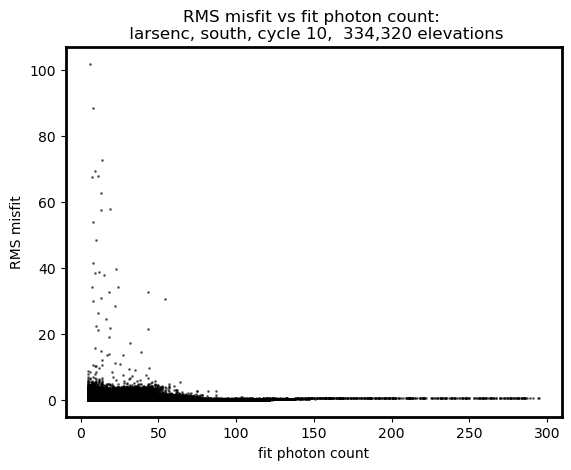

In [425]:
plt.scatter(ss_atl06_sr.n_fit_photons, ss_atl06_sr.rms_misfit, color='black', s=1, alpha=0.5)
plt.ylabel('RMS misfit')
plt.xlabel('fit photon count')
#plt.xlim([cnt-1, 80])
#plt.ylim([0, 5])
plt.title(f'RMS misfit vs fit photon count: \n {shelf}, {site}, cycle {cycle}, {len(ss_atl06_sr.index): ,} elevations')

Text(0.5, 1.0, 'RMS misfit vs fit photon count: \n larsenc, south, cycle 10,  334,320 elevations')

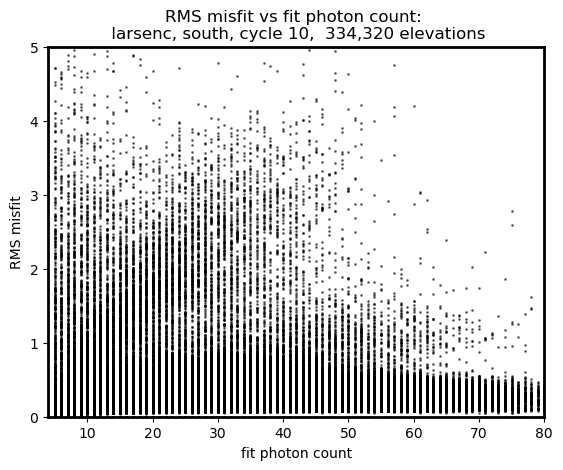

In [424]:
plt.scatter(ss_atl06_sr.n_fit_photons, ss_atl06_sr.rms_misfit, color='black', s=1, alpha=0.5)
plt.ylabel('RMS misfit')
plt.xlabel('fit photon count')
plt.xlim([cnt-1, 80])
plt.ylim([0, 5])
plt.title(f'RMS misfit vs fit photon count: \n {shelf}, {site}, cycle {cycle}, {len(ss_atl06_sr.index): ,} elevations')

In [411]:
hist = np.histogram(ss_atl06_sr.rms_misfit, 5000)
mode = hist[1][np.argmax(hist[0])]
threshold = 1.0

/var/folders/_l/6jgyk_ms6jb13hn0khtb7f7m003707/T/ipykernel_74359/2191392174.py:12: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f'../figs/rms_serial_{shelf}_{site}_{cycle}.png', dpi=200, bbox_inches='tight')
/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


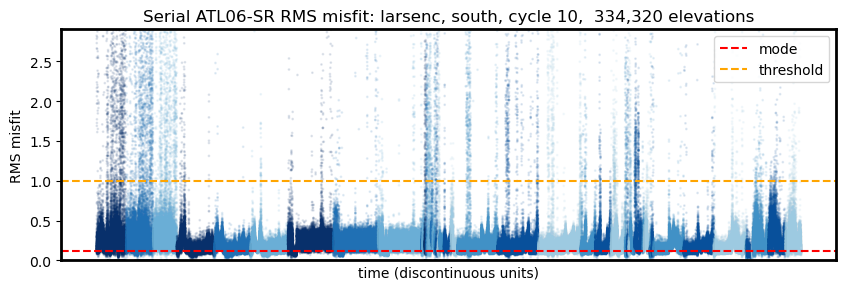

In [412]:
plt.figure(figsize=[10, 3])
rms_shuffled = np.random.shuffle(ss_atl06_sr.rms_misfit.values.copy())
plt.scatter(ss_atl06_sr.reset_index().index.values, ss_atl06_sr.rms_misfit.values, c=np.append(ss_atl06_sr['gt'].values[1:]+20, 0), cmap='Blues', s=1, alpha=0.1)
plt.axhline(y=mode, color='red', linestyle='--', label='mode')
plt.axhline(y=threshold, color='orange', linestyle='--', label='threshold')
plt.ylim([-0.0, 2.9])
plt.title(f'Serial ATL06-SR RMS misfit: {shelf}, {site}, cycle {cycle}, {len(ss_atl06_sr.index): ,} elevations')
plt.xticks([])
plt.ylabel('RMS misfit')
plt.xlabel('time (discontinuous units)')
plt.legend()
plt.savefig(f'../figs/rms_serial_{shelf}_{site}_{cycle}.png', dpi=200, bbox_inches='tight')

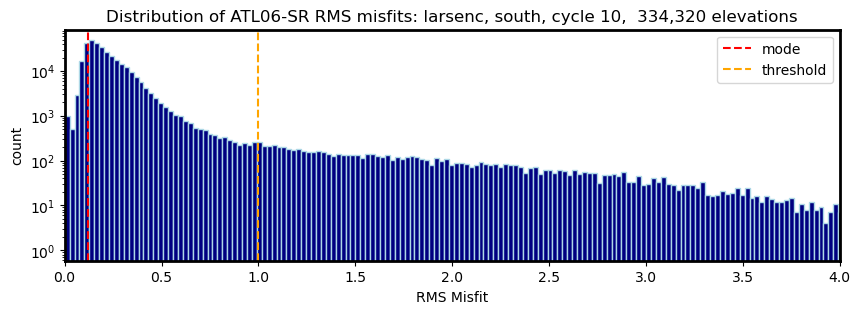

In [413]:
plt.figure(figsize=[10, 3])
plt.hist(ss_atl06_sr.rms_misfit, 4000, color='navy', edgecolor='lightblue', density=False)
plt.axvline(x=mode, color='red', label='mode', linestyle='--')
plt.axvline(x=threshold, color='orange', label='threshold', linestyle='--')
plt.yscale('log')
#plt.ylim([0, 0.5])
plt.xlim([0, 4])
plt.ylabel('count')
plt.xlabel('RMS Misfit')
plt.title(f'Distribution of ATL06-SR RMS misfits: {shelf}, {site}, cycle {cycle}, {len(ss_atl06_sr.index): ,} elevations')
plt.legend()
plt.savefig(f'../figs/rms_dist_{shelf}_{site}_{cycle}.png', dpi=200, bbox_inches='tight')

In [178]:
x = np.linspace(0, 5, 1000)[1:]
rms = ss_atl06_sr.rms_misfit.copy().values
theta = np.var(rms) / np.mean(rms)
k = np.mean(rms) / theta*2.5

In [191]:
def log_normal_emp(x):
    mu = np.mean(x)
    std = np.std(x)
    var = np.var(x)
    return (x*std*np.sqrt(2*np.pi))**(-1)*np.exp(-(np.log(x)-mu)**2/(2*var))

In [192]:
pdf = st.gamma.pdf(x, k, scale=theta, loc = 0*np.mean(rms))
pdf = log_normal_emp(rms)

/var/folders/_l/6jgyk_ms6jb13hn0khtb7f7m003707/T/ipykernel_74359/1955267201.py:5: RuntimeWarning: divide by zero encountered in reciprocal
  return (x*std*np.sqrt(2*np.pi))**(-1)*np.exp(-(np.log(x)-mu)**2/(2*var))
/var/folders/_l/6jgyk_ms6jb13hn0khtb7f7m003707/T/ipykernel_74359/1955267201.py:5: RuntimeWarning: divide by zero encountered in log
  return (x*std*np.sqrt(2*np.pi))**(-1)*np.exp(-(np.log(x)-mu)**2/(2*var))


In [301]:
#ss_atl06_sr_full = ss_atl06_sr
#ss_atl06_sr = ss_atl06_sr[ss_atl06_sr.rms_misfit<=threshold]

0, (10, 56, 'gt3r')
1, (10, 56, 'gt2r')
2, (10, 56, 'gt1r')
3, (10, 64, 'gt3r')
4, (10, 64, 'gt2r')
5, (10, 64, 'gt1r')
6, (10, 117, 'gt3r')
7, (10, 117, 'gt2r')
8, (10, 117, 'gt1r')
9, (10, 125, 'gt2r')
10, (10, 125, 'gt1r')
11, (10, 178, 'gt3r')


/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


12, (10, 178, 'gt2r')
13, (10, 178, 'gt1r')
14, (10, 186, 'gt2r')
15, (10, 186, 'gt1r')
16, (10, 559, 'gt2l')


/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


17, (10, 559, 'gt3l')
18, (10, 559, 'gt1l')
19, (10, 567, 'gt2l')
20, (10, 567, 'gt3l')


/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/var/folders/_l/6jgyk_ms6jb13hn0khtb7f7m003707/T/ipykernel_74359/488810005.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[10, 3])


21, (10, 567, 'gt1l')
22, (10, 620, 'gt2l')
23, (10, 620, 'gt3l')
24, (10, 620, 'gt1l')
25, (10, 628, 'gt2l')
26, (10, 628, 'gt3l')
27, (10, 628, 'gt1l')
28, (10, 681, 'gt2l')
29, (10, 681, 'gt3l')
30, (10, 681, 'gt1l')
31, (10, 689, 'gt2l')
32, (10, 689, 'gt3l')


/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


33, (10, 803, 'gt2l')
34, (10, 803, 'gt1l')
35, (10, 887, 'gt2l')
36, (10, 887, 'gt3l')
37, (10, 1001, 'gt2l')
38, (10, 1001, 'gt3l')


/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/ccroberts/opt/anaconda3/envs/fresh/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


39, (10, 1062, 'gt2l')
40, (10, 1062, 'gt3l')
41, (10, 1062, 'gt1l')
42, (10, 1070, 'gt2l')
43, (10, 1070, 'gt3l')
44, (10, 1070, 'gt1l')
45, (10, 1329, 'gt2l')
46, (10, 1329, 'gt3l')
47, (10, 1329, 'gt1l')


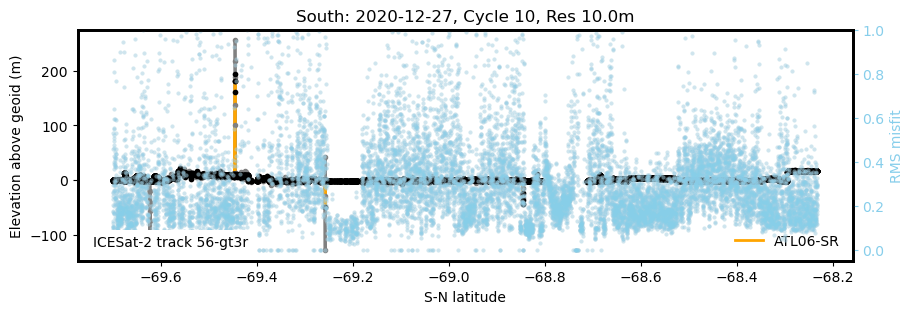

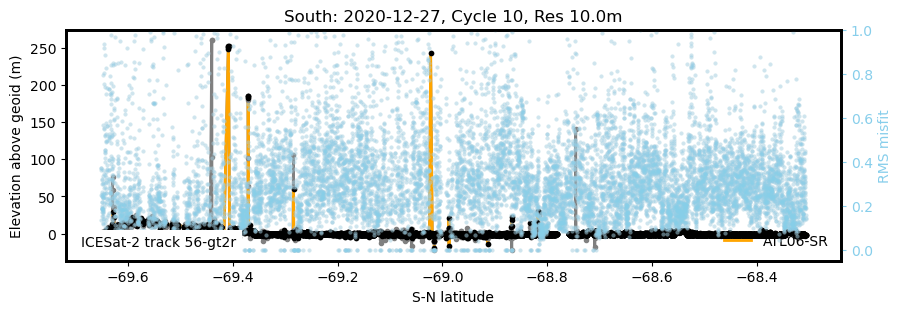

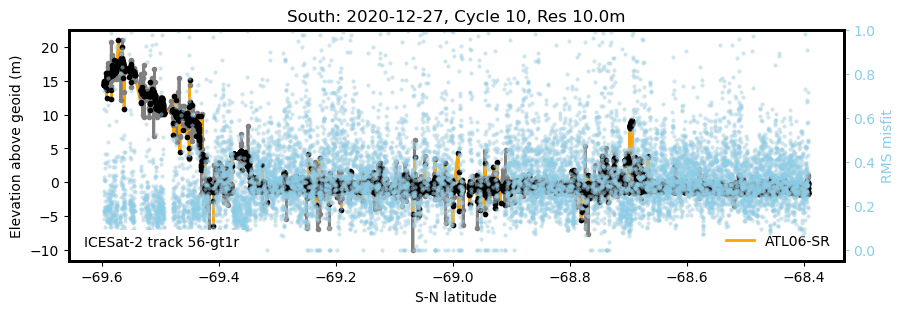

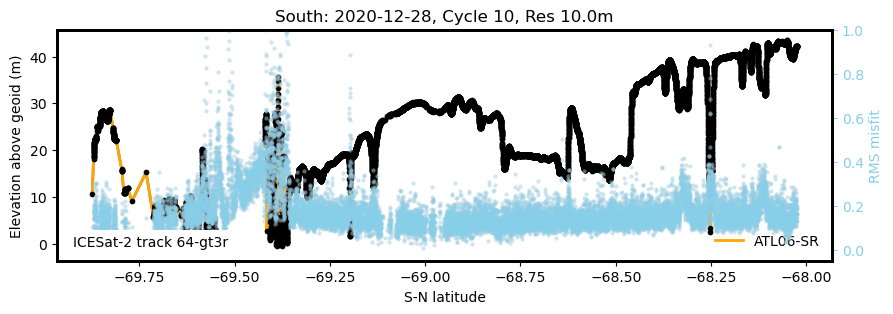

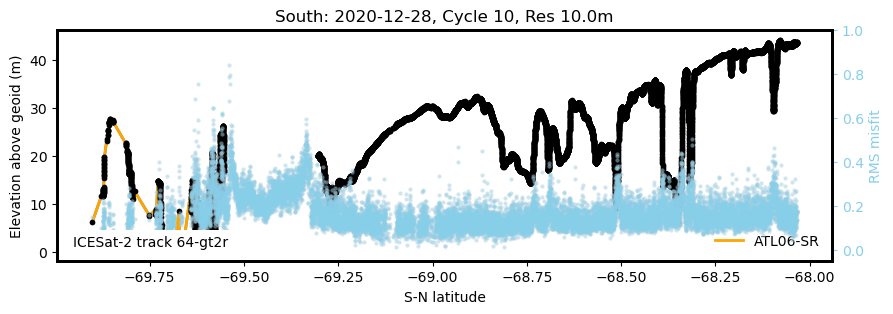

...

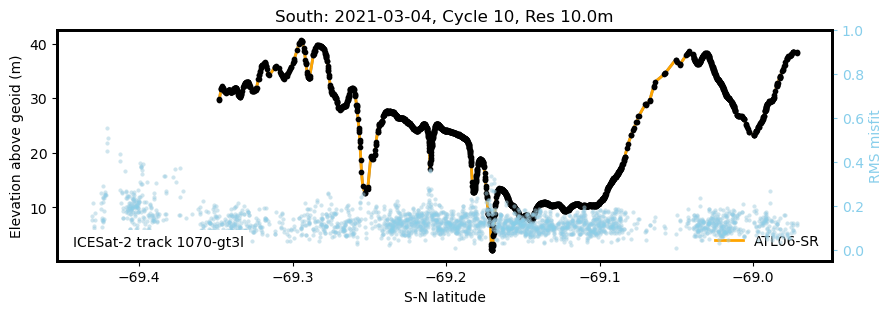

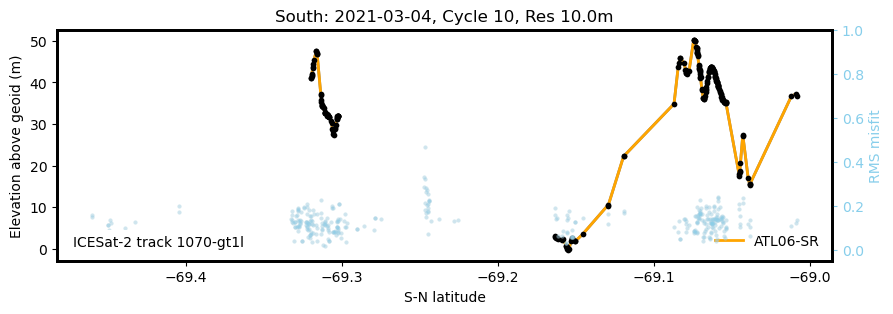

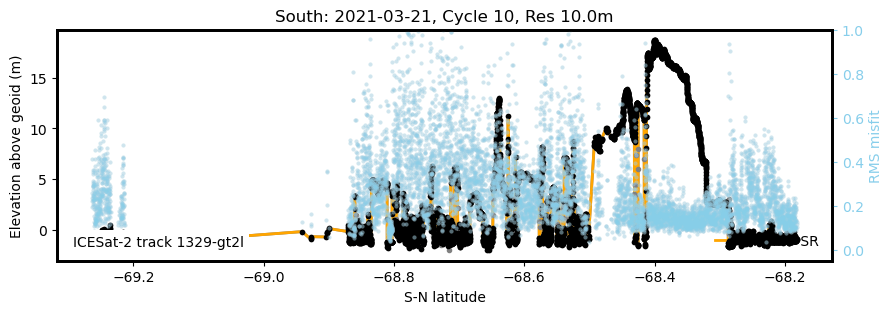

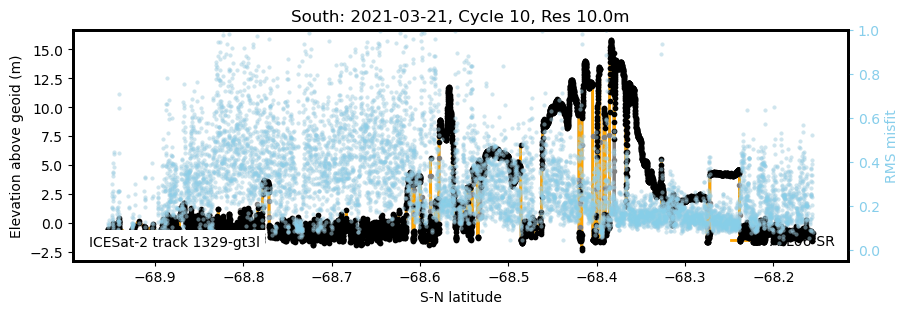

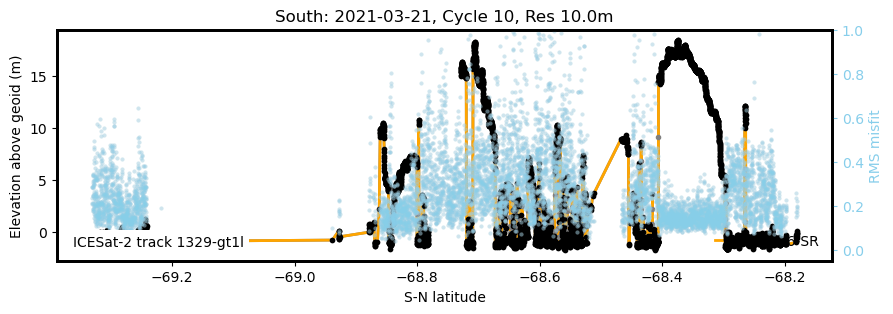

In [423]:
#ss_atl06_sr = ss_atl06_sr[ss_atl06_sr.rms_misfit<=threshold]
#ss_atl06_sr = ss_atl06_sr_full
# Plot method (0: random track, 1: everything, 2: specific track)
plotMethod = 1
savePlot = False

# plot settings (based on DEM)
yl = None#[-500, 100]
xl = None #[-66.31, -66.27]
xBuffer = 0.3
yBuffer=0.0

#################################
# Plotting function
longestMel = t.getTrack(melange_sr, trackList[lens.index(max(lens))])[0]
pltWidth = (longestMel.geometry.y.max()-longestMel.geometry.y.min())*(1.0+xBuffer)
pltBuffer = (ss_atl06_sr.h_mean.max()-ss_atl06_sr.h_mean.min())*(yBuffer)
yl = [np.percentile(ss_atl06_sr.dem_h, 0.1)-pltBuffer, np.percentile(ss_atl06_sr.dem_h, 99.9)+pltBuffer]
yl= [-5, 90]
yl=None
xl=None

def plot06(trackData, save=False, point='-', titl='ATL06 Data', xlab='S-N latitude', ylab='Elevation above geoid (m)',
          xBuffer=0.3, yl=None, xvar='lat', plot_dem=False):
    track, mTrack, cycle, rgt, gt, dat = trackData[0], trackData[1], trackData[2], trackData[3], trackData[4], trackData[5]
    
    #plot the track
    fig, ax = plt.subplots(figsize=[10, 3])

    if xvar=='lat': x = track.geometry.y
    elif xvar=='dist': x = (track['distance']-track['distance'][0])/1000

    if plot_dem:
        y = track.dem_h#-(ss_atl06_sr.geoid+ss_atl06_sr.tide_earth+ss_atl06_sr.tide_cats)
        #ax.plot(x, y, '-', color='gray', linewidth=2, label='REMA')

    #tot_mean=np.mean(ss_atl06_sr.h_mean)
    rms_color='skyblue'
    axt = ax.twinx()
    #axt.axhline(y=tot_mean, linestyle='--', color='lightgray', linewidth=2, label='ensemble mean')
    axt.scatter(x, track.rms_misfit, s=1, color='lightgray', linewidth=2, alpha=0.3, label='track RMS misfit')
    axt.scatter(x[track.rms_misfit<threshold], track.rms_misfit[track.rms_misfit<threshold], s=1, color=rms_color, linewidth=2, alpha=0.3, label='track RMS misfit')
    axt.set_ylabel('RMS misfit', color=rms_color)
    axt.tick_params(colors=rms_color, labelcolor=rms_color)
    axt.set_ylim([-0.05, 1])

    y = track.h_mean
    ax.plot(x, y, '-', color='gray', linewidth=2, label=None)
    ax.plot(x, y, point, color='gray', alpha=1, linewidth=2.5, zorder=100)#, label='ATL06-SR')

    ax.plot(x[track.rms_misfit<threshold], y[track.rms_misfit<threshold], '-', color='orange', linewidth=2, label='ATL06-SR')
    ax.plot(x[track.rms_misfit<threshold], y[track.rms_misfit<threshold], point, color='black', alpha=1, linewidth=2.5, zorder=100)#, label='ATL06-SR')

    if xvar=='lat': x = mTrack.geometry.y
    elif xvar=='dist': x = (mTrack['distance']-mTrack['distance'][0])/1000
    y = mTrack.h_mean
    #ax.plot(x, y, '.', color='red', linewidth=2.5)#, label='ATL06-SR mélange')
    ax.set_title(titl)
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    avg = np.mean(track.h_mean)
    ax.set_ylim(yl)
    ax.set_xlim(xl)
    
    # set window
    # if there is melange, center it
    # otherwise center the entire track
    try: 
        med = np.median(mTrack.geometry.y)
        mMax = mTrack.geometry.y.max()
        mMin = mTrack.geometry.y.min()
        buffer = np.abs(mMax - mMin)*xBuffer
        #ax.set_xlim([med-pltWidth/2, med+pltWidth/2])
    except:
        #print('doing the other one')
        med = np.median(track.geometry.y)
        tMax = track.geometry.y.max()
        tMin = track.geometry.y.min()
        buffer = np.abs(tMax - tMin)*xBuffer
        #ax.set_xlim([tMin-buffer, tMax+buffer])
    ax.legend(loc=4, frameon=False)
    info = f'ICESat-2 track {rgt}-{t.gtDict[gt]}'
    plt.text(0.02, 0.05, info, horizontalalignment='left', verticalalignment='bottom',
             transform=ax.transAxes, fontsize=10, bbox=dict(edgecolor=None, facecolor='white', linewidth=0))
    if save:
        plt.savefig(f'{figRoot}melange/{site}_cyc{cycle}_rgt{rgt}-{t.gtDict[gt][-2:]}_res{res}_mel.png', 
                    dpi=150, bbox_inches='tight')
    
###################################    
#Plotting commands

if plotMethod==0:
    tr = sample(trackList, 1)[0]
    track, cycle, rgt, gt = t.getTrack(ss_atl06_sr, tr)
    mTrack, cycle, rgt, gt = t.getTrack(melange_sr, tr)
    dat = track.time.min().date()
    
    trackData = [track, mTrack, cycle, rgt, gt, dat]
    titl = f"{site.capitalize()}: {dat}, Cycle {cycle}, Res {res}m"
    xlab = 'S-N latitude'
    ylab = 'Elevation above geoid (m)'
    plot06(trackData, point='.', save=savePlot, titl=titl, xlab=xlab, ylab=ylab, yl=yl, xBuffer=0.3, plot_dem=True)
    
elif plotMethod==1:
    count=0
    tot_mean = np.mean(ss_atl06_sr.h_mean)
    
    for tr in trackList:
        print(f"{count}, {tr}")
        count+=1
        
        track, cycle, rgt, gt = t.getTrack(ss_atl06_sr, tr)
        mTrack, cycle, rgt, gt = t.getTrack(melange_sr, tr)
        dat = track.time.min().date()
        
        trackData = [track, mTrack, cycle, rgt, gt, dat]
        titl = f"{site.capitalize()}: {dat}, Cycle {cycle}, Res {res}m"
        xlab = 'S-N latitude'
        ylab = 'Elevation above geoid (m)'
        plot06(trackData, point='.', save=savePlot, titl=titl, xlab=xlab, ylab=ylab, yl=yl, xBuffer=0.3, plot_dem=True)
        #plt.axhline(y=60)
    

(-9.0, 69.0)

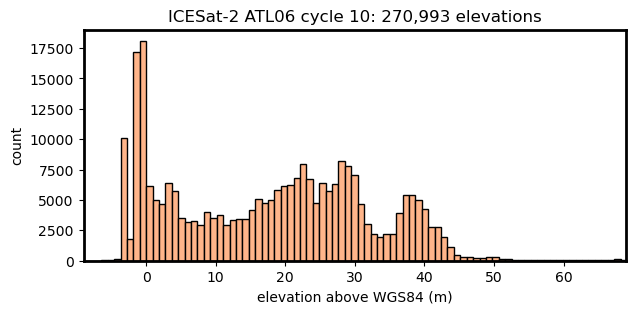

In [415]:
plt.figure(figsize=[7, 3])
length = len(ss_atl06_sr[ss_atl06_sr.h_mean<200])
plt.hist(ss_atl06_sr[ss_atl06_sr.h_mean<200].h_mean, 350, density=False, color='#ffb58a', edgecolor='black')
plt.xlabel('elevation above WGS84 (m)')
plt.ylabel('count')
plt.title(f'ICESat-2 ATL06 cycle 10: {length:,} elevations')
plt.xlim([-9, 69])

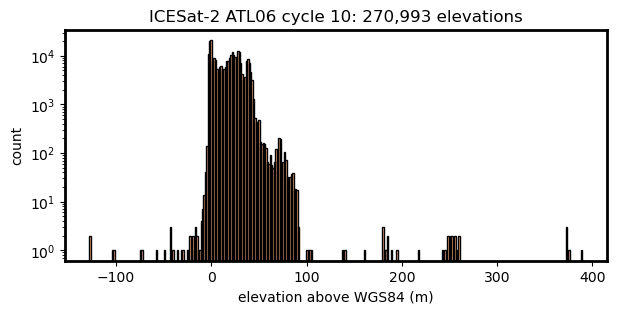

In [422]:
plt.figure(figsize=[7, 3])
#length = len(ss_atl06_sr[ss_atl06_sr.h_mean<200])
plt.hist(ss_atl06_sr.h_mean, 350, density=False, color='#ffb58a', edgecolor='black')
plt.xlabel('elevation above WGS84 (m)')
plt.ylabel('count')
plt.title(f'ICESat-2 ATL06 cycle 10: {length:,} elevations')
plt.xlim([, 69])
plt.yscale('log')